# Case Study 1: From Exploration to Design

- Name: Ella Ilan
- Student ID: 76021690
- Link to GitHub Repository: https://github.com/ellailan/smartwatches-distracted-driving/


In [20]:
devtools::install_github("lbelzile/hecedsm")
install.packages('tidyverse')
install.packages('wesanderson')

Skipping install of 'hecedsm' from a github remote, the SHA1 (df0a5444) has not changed since last install.
  Use `force = TRUE` to force installation

Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done

Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done



In [21]:
library(tidyverse)
library(hecedsm)

##my own packages, for more aesthetically pleasing graphs later
library(wesanderson)

In [22]:
driving_distraction <- BRLS21_EDA

## Understanding the Research Paper
#### *Smartwatches are more distracting than mobile phones while driving*, Brodeur et al. (2021)





This research paper aimed to better understand the severity of distracted driving caused by different digital communication mediums. It sought to differentiate between the impact of smartwatches and smartphones, as well as to better understand if there’s a difference in distraction between inbound and outbound messages, when sent through text or through voice messaging. 
The experiment consisted of 31 participants in a driving simulator. Distraction was measured through eye-tracking gaze distribution and driving performance, across three main conditions. 
<br>
1. Receiving notifications on a mobile phone, answering orally. 
2. Receiving notifications on a smartwatch, answering orally.
3. Receiving notifications by speaker, answering orally.
4. Receiving notifications in a “texting” condition by either phone or watch, where they had to reply through texting to the notifications.
<br>
Results showed that distracted gaze was the worst in the texting condition, then in smartwatches, then in the phone. The least distracted gaze was found when notifications were communicated through a speaker. Driving performance was the same in all conditions but the texting one, in which performance declined. 
Overall, this paper suggests that audio reception and vocal transmission of text is safer while driving, and that smartwatches may pose a greater risk to vehicle safety than is currently commonly understood. This research may support broader road safety campaigns targetting smart-watches or encouraging the use of text-to-speech, speech-to-text capabilities on the road. 



## Exploring the Data

Let's investigate our driving_distraction using the glimpse() function to better understand the research.

In [23]:
glimpse(driving_distraction)

Rows: 10,942
Columns: 6
$ id        <fct> 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, …
$ reltime   <int> 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17…
$ task      <fct> baseline, baseline, baseline, baseline, baseline, baseline, …
$ occurence <int> 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, …
$ eda       <dbl> 20.60959, 21.41062, 22.26244, 24.22100, 24.23851, 23.63703, …
$ hr        <dbl> 88.49560, 88.31564, 78.13892, 65.82009, 65.13290, 66.83456, …


#### Our dataset contains six variables, for which there are 10,942 observations.  They are: <br>

id: participant identifier, *a factor and categorical variable*
<br>
reltime: relative time of the task, *an integer and numerical variable*
<br>
task: either baseline or a distraction, as defined in the previous description, *a factor and categorical variable*
<br>
occurence: number of occurences, *an integer and a numerical variable*
<br>
eda: electrodermal activity measure, *a double and a numerical variable*. (This is a measure of skin's electrical properties due to sweat, used often to quantify stress.)
<br>
hr: heart rate, *a double and a numerical variable*

<br>

These driving_distraction types all align neatly with the type of variable they repersent (factor for categories, dbl or float or integer for numerical measurements). As such, we can move forward without converting any driving_distraction types. 

<br>

Let's investigate to see if we have any missing values, and at what proportions. 

In [24]:
na_count <- driving_distraction |>
  summarize(across(everything(), ~ sum(is.na(.))))


na_prop <- driving_distraction |>
    summarize(across(everything(), ~ mean(is.na(.)))) |>
    pivot_longer(everything(),
               names_to = "variable",
               values_to = "prop_missing") |>
    mutate(prop_missing = prop_missing*100) #so can see percentages!

na_count
na_prop

id,reltime,task,occurence,eda,hr
<int>,<int>,<int>,<int>,<int>,<int>
0,0,0,0,214,538


variable,prop_missing
<chr>,<dbl>
id,0.000000
reltime,0.000000
task,0.000000
occurence,0.000000
eda,1.955767
hr,4.916834


The only place where we have NA values is in our EDA and HR variables. Recallt that these come from sensor measurements. I'd guess there values were remitted due to malfunctioning equipment/obvious errors in administraion. Though there are 214 missing eda measurements and 538 missing hr ones, note that these only make up 1.955% and 4.915% of their respective variables. This is a small proportion, so we can move forward.

<br>

We're interested in seeing if there are any class imbalances in our dataset. There's only one categorical variable that repersents "class" (the other is simply used for identification). Let's take a look at the distribution across classes. 

In [42]:
classes <- driving_distraction |>
    select(task) |>
    pivot_longer(everything(),
               names_to = "variable",
               values_to = "category") |>
    count(variable, category) |>
    group_by(variable) |>
    mutate(prop = n / sum(n)) |>
    arrange(variable, desc(prop)) 

class_imbalance <- classes |> filter(prop >= 0.25)

class_imbalance

variable,category,n,prop
<chr>,<fct>,<int>,<dbl>
task,watch,3786,0.3460062
task,cell,3028,0.2767319
task,baseline,2736,0.2500457


There's a slight class imbalance, with a larger number of voicecall trials. We will investigate this ```classes``` dataframe more later in the case study.

### Data Visualizaton 

Select two numerical variables from the dataset and name them here. What type of plot would be appropriate to explore the relationship between these two variables? Write the R code to produce this plot. Describe any pattern you observe. 

Let's consider two numerical variables heartrate and Electrodermal Activity. Both are used to measure stress. 

Warning message:
“Removed 739 rows containing missing values or values outside the scale range
(`geom_point()`).”


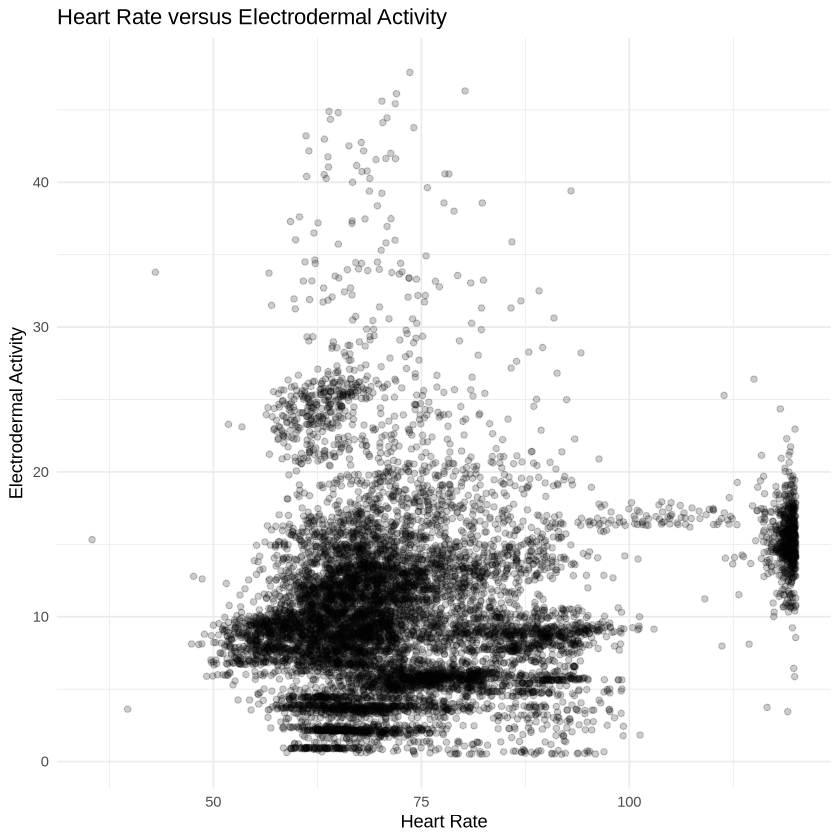

In [26]:
hr_v_eda <- driving_distraction |> ggplot(aes(x = hr, y = eda)) + geom_point(alpha = 0.2) +
                    labs(title = "Heart Rate versus Electrodermal Activity",
                        x = "Heart Rate", y = "Electrodermal Activity") +
                        theme_minimal()
hr_v_eda

There isn't an apparent relationship between Heart Rate and Electrodermal Activity. In fact, we can investiage on a case by case basis by coloring by id, and diffrentiating each unique experiment participant. 

Warning message:
“Removed 739 rows containing missing values or values outside the scale range
(`geom_point()`).”


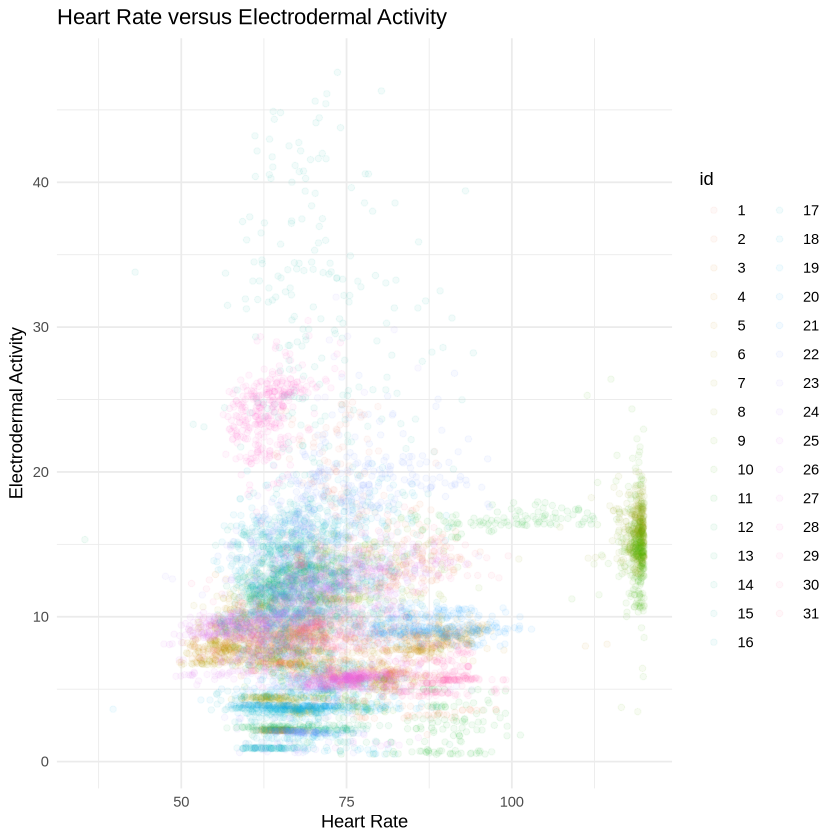

In [27]:
hr_v_eda_colored <- driving_distraction |> ggplot(aes(x = hr, y = eda, color = id)) + geom_point(alpha = 0.05) +
                    labs(title = "Heart Rate versus Electrodermal Activity",
                        x = "Heart Rate", y = "Electrodermal Activity") +
                        theme_minimal()
hr_v_eda_colored

The straight-line clusters of horizontal dots in identitcal colors that there is no change in electrodermal activity for a change in heart rate for that specific user; i.e. that electrodermal activity seems to be unique per participant and not related to heartrate. 

Warning message:
“Removed 214 rows containing non-finite outside the scale range (`stat_bin()`).”


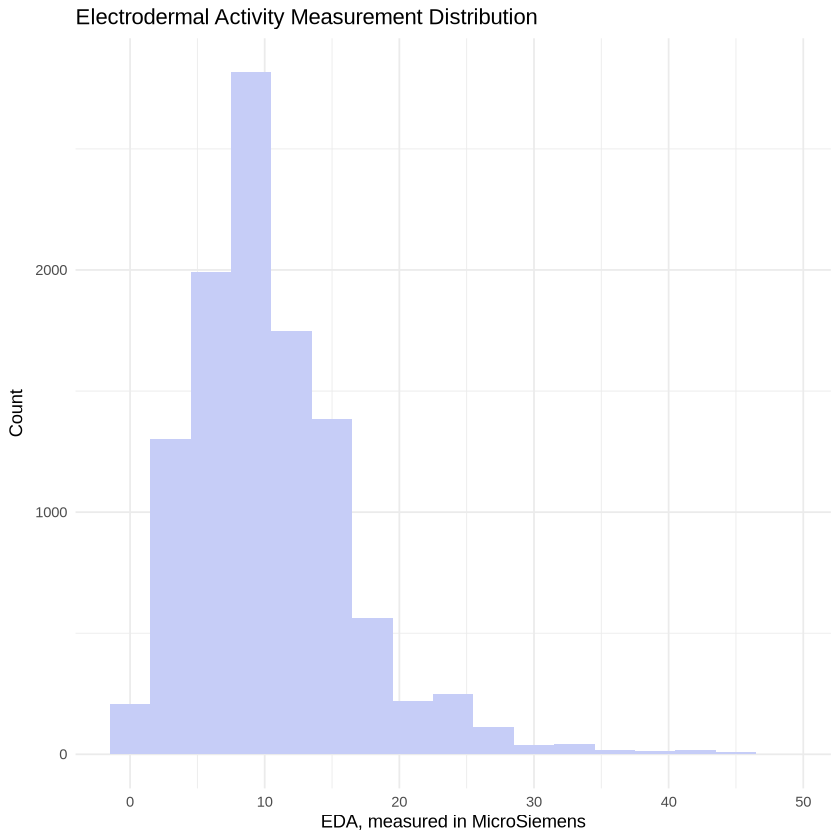

In [28]:
hr_histogram <- driving_distraction |>
  ggplot(aes(x = eda)) +
  geom_histogram(binwidth = 3, fill = wesanderson::wes_palette("GrandBudapest2")[2]) +
  labs(title = "Electrodermal Activity Measurement Distribution",
    x = "EDA, measured in MicroSiemens",
    y = "Count") +
    theme_minimal()

hr_histogram

Warning message:
“Removed 538 rows containing non-finite outside the scale range
(`stat_boxplot()`).”


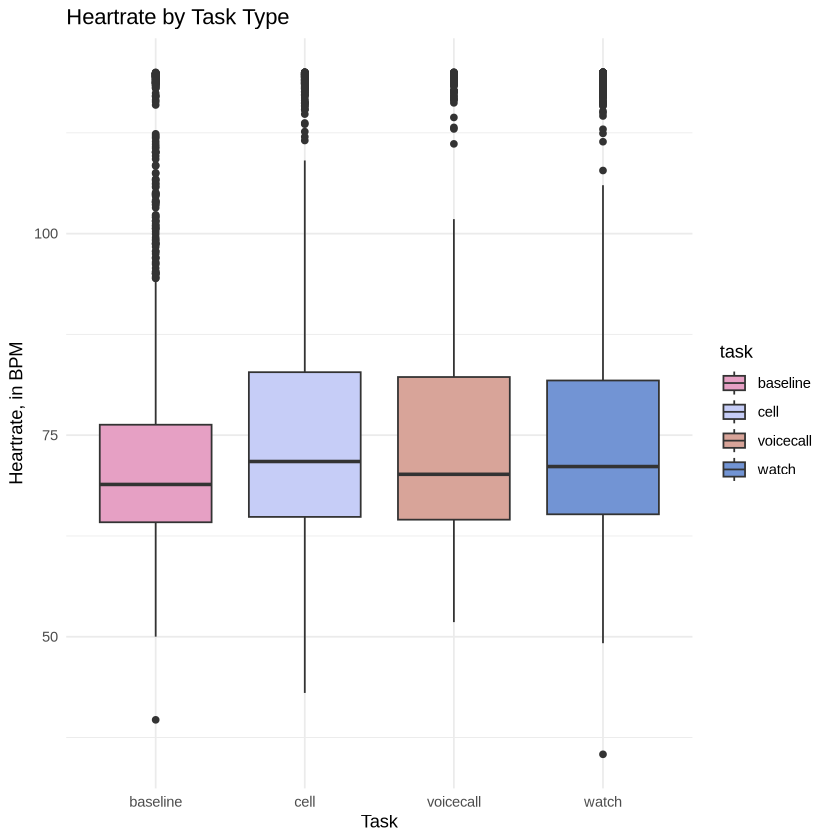

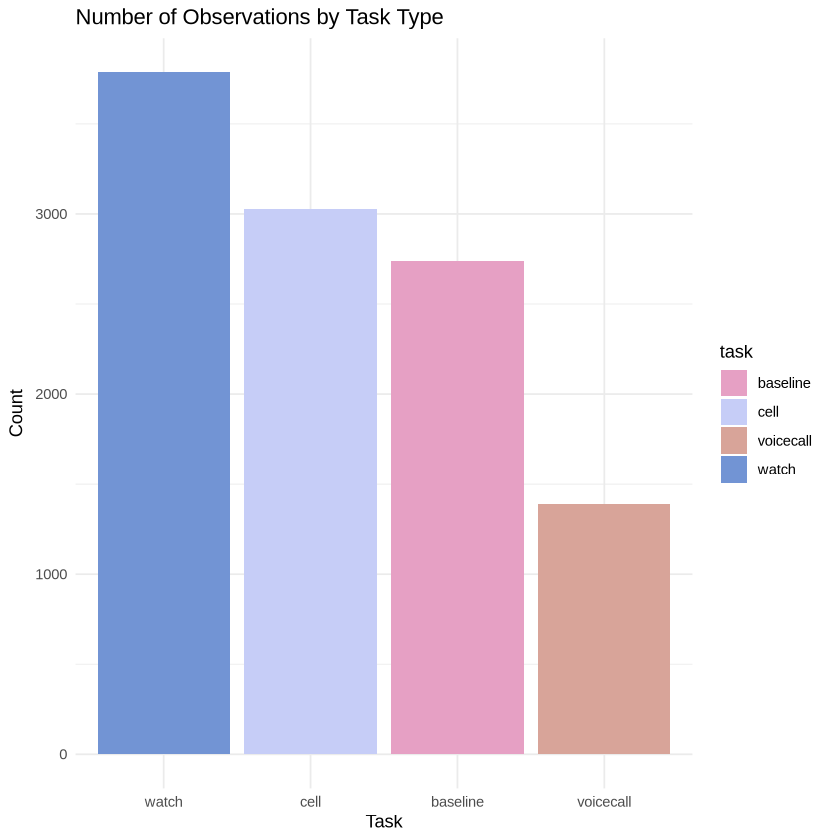

In [29]:
hr_task_plot <- driving_distraction |>
  ggplot(aes(x = task, y = hr, fill = task)) +
  geom_boxplot() +
  scale_fill_manual(values = wesanderson::wes_palette("GrandBudapest2")) +
  labs(title = "Heartrate by Task Type",
    x = "Task",
    y = "Heartrate, in BPM") +
    theme_minimal()

hr_task_plot

task <- driving_distraction |>
  ggplot(aes(x = fct_infreq(task), fill = task)) +
  geom_bar() +
    scale_fill_manual(values = wesanderson::wes_palette("GrandBudapest2")) +
  labs(title = "Number of Observations by Task Type",
    x = "Task",
    y = "Count") +
    theme_minimal()

task

### Some more insights ... Summary Statistics
Let's compute some summary statistics to help us better understand the graphs above.

In [33]:
eda_summary <- driving_distraction |>
  summarize(mean = mean(eda, na.rm = TRUE),
    median = median(eda, na.rm = TRUE))

eda_summary

mean,median
<dbl>,<dbl>
10.39493,9.366185


Since our distribution of Electrodermal Activity was right-skewed, these summaries make sense. The right leaning tail makes the mean greater than the median. For a skewed distribution, we would prefer to report the **median** as a measure of central tendancy, as it is more resistant to those outlying values that make up the distribution tail.

Recall that earlier in this workbook, I defined a dataframe called classes as follows:

```

classes <- driving_distraction |>
    select(task) |>
    pivot_longer(everything(),
               names_to = "variable",
               values_to = "category") |>
    count(variable, category) |>
    group_by(variable) |>
    mutate(prop = n / sum(n)) |>
    arrange(variable, desc(prop)) 
    
```

Earlier, we only looked at class imbalance. Let's take a closer look at it's output. 

In [43]:
classes

variable,category,n,prop
<chr>,<fct>,<int>,<dbl>
task,watch,3786,0.3460062
task,cell,3028,0.2767319
task,baseline,2736,0.2500457
task,voicecall,1392,0.1272162


The dataset is  imbalanced across task categories, with watch being the most common (≈35%) and voicecall the least common (≈13%). Cell and baseline tasks occur at similar frequencies, each making up about a quarter of the observations. This stands out to me. The paper argued for the danger of smartwatches and relative safety of voicecall as a texting method while driving. I'm curious why they wouldn't be repeated the same number of times.

In [49]:
correlation_hr_eda <- driving_distraction |>
  summarize(overall_pearson = cor(hr, eda, use = "complete.obs"))

by_id_corr <- driving_distraction |>
  group_by(id) |>
  summarize(pearson = cor(hr, eda, use = "complete.obs"),
    n = n(),
    .groups = "drop")

simpsons_check <- by_id_corr |>
  summarize(mean_within_id = mean(pearson, na.rm = TRUE),
            median_within_id = median(pearson, na.rm = TRUE),
    min_within_id = min(pearson, na.rm = TRUE),
    max_within_id = max(pearson, na.rm = TRUE),
    prop_negative = mean(pearson < 0, na.rm = TRUE))

correlation_hr_eda
by_id_corr
simpsons_check

overall_pearson
<dbl>
0.1435454


id,pearson,n
<fct>,<dbl>,<int>
1,-0.1464346695,87
2,0.1393060678,352
3,-0.1654547462,374
4,0.3767395192,431
5,0.6168066197,374
6,-0.5117614583,373
7,0.5417219188,339
8,0.0235946174,378
9,0.4121108850,371


mean_within_id,median_within_id,min_within_id,max_within_id,prop_negative
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
0.1829371,0.1393061,-0.5117615,0.8450056,0.2580645


I wanted to quantify the relationship (or observed lack thereof) in the graph between EDA and heartrate. Overall, we calcuated a Pearson's Correlation Coefficient of 0.1435454, or very weakly positive. I would not consider there to be a relationship between heartrate and EDA overall.

More interestingly, however, I was interested in seeing if this was different for individual participants. We got mostly a similar result, with a mean Correlation of 0.1829371 and a median of 0.1393061, still a weak positive correlation. However, some individuals experienced a strong positive correlation, as high as a maximum value of 0.8450056. According to the [Wikipedia article on EDA](https://en.wikipedia.org/wiki/Electrodermal_activity), it's often recorded alongside heartrate because of their inherent dependance on one another. This makes sense to me intutively, as someone who sweats a lot under stress. I'm curious why the average relationship between EDA and heartrate isn't positive. 

To investiage this further, I really want to graph some those stronger correlated heartrates. Let's adapt the graph from earlier in this report. 

Warning message:
“Removed 110 rows containing missing values or values outside the scale range
(`geom_point()`).”


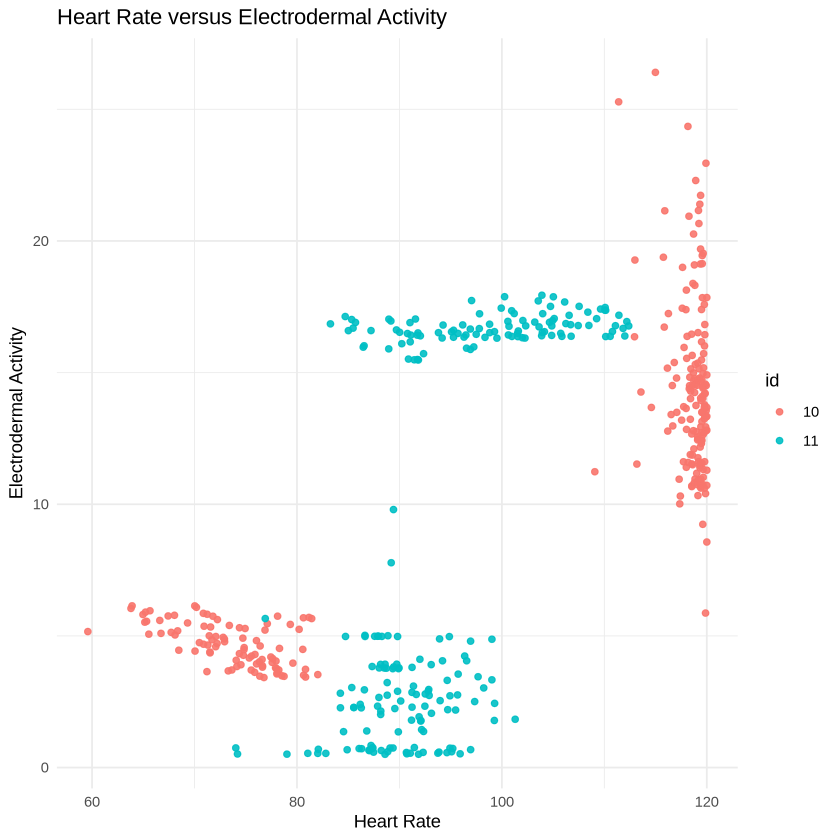

In [64]:
hr_v_eda_pos_cor <- driving_distraction |> filter(id == 10 | id == 11) |> ggplot(aes(x = hr, y = eda, color = id)) + geom_point(alpha = 0.9) +
                    labs(title = "Heart Rate versus Electrodermal Activity",
                        x = "Heart Rate", y = "Electrodermal Activity") +
                        theme_minimal()
hr_v_eda_pos_cor

Warning message:
“Removed 110 rows containing missing values or values outside the scale range
(`geom_point()`).”


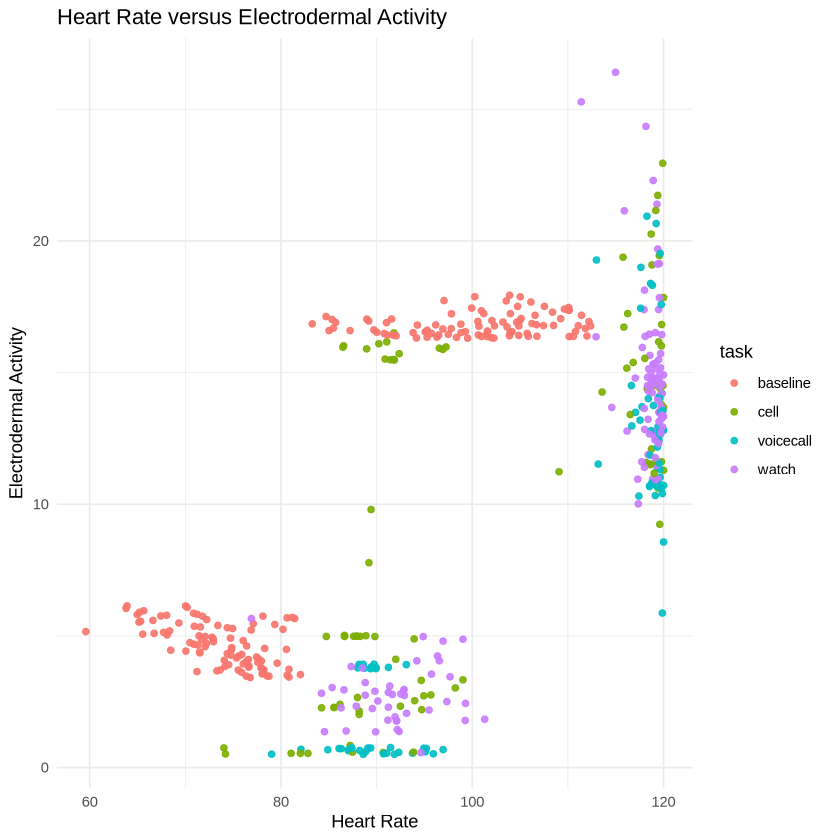

In [65]:
hr_v_eda_by_task <- driving_distraction |> filter(id == 10 | id == 11) |> ggplot(aes(x = hr, y = eda, color = task)) + geom_point(alpha = 0.9) +
                    labs(title = "Heart Rate versus Electrodermal Activity",
                        x = "Heart Rate", y = "Electrodermal Activity") +
                        theme_minimal()
hr_v_eda_by_task

These graphs show us some interesting insights about highly correlated individuals. Most critically, this high correlation coefficient for both pariticpant 10 and 11 isn't coming from a straight linear relation as expected, but rather odd discrete clusters per individual. 

I was curious if maybe these clusters were being caused by different tasks– which the paper focuses on identifying as causes of stress. 

For participant 10, it seems only one task was measured, so the reason for the jump in EDA and heartrate is unknown For participant 11, there seems to be an evenly distributed number of measurements per task in each cluster, meaning that the jump in heart rate isn't necessarily correlated to task, either.


### Sampling and Study Design

What types of questions were asked in this study? Let's refer back to the definitons from [our trusty Data Science 100 textbook](https://datasciencebook.ca/intro.html#asking-a-question).

> DESCRIPTIVE: A question that asks about summarized characteristics of a data set without interpretation (i.e., report a fact).

This study summarizes characteristics of distraction, driving performance, and mental workload under different conditions (smartwatch, mobile phone, speaker, texting). The kind of statements that came from this were of the type of: "participants were more distracted in the smartwatch condition than the phone condition".

> INFERENTIAL: A question that looks for patterns, trends, or relationships in a single data set and also asks for quantification of how applicable these findings are to the wider population.

This study compared conditions with the aim to generalize findings beyond their 31 participants. This type of question is what lead to conclusions of the type of: "smartwatches are generally more distracting than phones".

> CAUSAL: A question that asks about whether changing one factor will lead to a change in another factor, on average, in the wider population.	

**Arguably, this is the most important type of question asked in this study**. The researchers manipulated device and message type for each participant in a controlled experiment with the hopes of observing the effects of these changes while keeping other factors constant. These experiments were designed to determine whether the type of device (smartwatch, mobile phone, speaker) or message format (text vs. voice) directly *caused* driver distraction and performance. 

### Population v. Sample
Let's look at our population of interest more closely: 

**Population**: The population of interest is all drivers who might use smartwatches, mobile phones, or voice devices while driving. The researchers want to understand how these devices affect distraction and driving performance for drivers in general.

**Sample**: The sample actually observed in the study consisted of 31 participants who took part in a driving simulator experiment, where they received and responded to text or voice messages under four different conditions (smartwatch, mobile phone, speaker, and texting).

### Controlled or Observed?

This was a controlled experiment!

The researchers manipulated the type of device and message type (smartwatch, mobile phone, speaker, texting) for each participant. By controlling these conditions and observing the resulting distraction and driving performance, they could test the causal effect of changing device or message type. Unlike an observational study, where researchers only measure variables without intervention, this study actively assigned treatments and controlled the environment through a driving simulator to isolate the effects of each condition.

### Confounding Variables

The researchers controlled for individual differences in driving ability and distraction by using a within-subject design, where all participants take part in every condition*. This design reduces variability caused by participant characteristics because each person serves as their own control. A confounding variable not explicitly controlled could be prior experience with smartwatches or texting while driving, which might affect distraction levels.

*We don't have the data for all participants in every condition. For example, Participant 10, as discovered in a graph above, doesn't have recorded data on any conditions other than the baseline.

### Sampling Method

The authors used a convenience sample of volunteers recruited through their institution’s research panel. Participants chose to join this study based on its description. Thirty-one participants aged 18–47 were screened for health and driving criteria before participating. This method was likely chosen for practical reasons, including ease of recruitment and access to participants who met the study requirements, such as participants with a driving license. The participants were reimbursed with a gift card.

### Sampling Bias

Using a small convenience sample from a university research portal does not represent the broader population of drivers, especially in terms of age, driving experience, and familiarity with technology. This sample, like many voluntary research samples in research universities, likely suffers from [WEIRD BIAS](https://www.psychologytoday.com/ca/blog/evolutionary-social-cognition/202410/demographic-acronym-weird-overused-in-psychology-research#:~:text=The%20acronym%20%22WEIRD%22%20stands%20for,populations%20and%20regions%20under%20study.). This is a type of bias that happens due to a greater systematic bias of university students to be Westernized, Educated, Industrialized, Rich, and Democratic. This sampling bias may affect conclusions in many ways, such as (but not limited to) the following:

- The conclusion may not reflect the behaviors of drivers in countries with more or less strict driving and distracted driving laws.
- The conclusion may not reflect the behaviours of older drivers, who are less comfortable with smartwatches, phones, or texting.
- The conclusion may not reflect the behaviours of drivers with more or less driving experience. 

Overall, these findings may overestimate or underestimate distraction levels for the general population across device and message types.

### What would I do?

If I had the chance to design this study again, I think I would change both the sampling method and the experimental design.

For the sampling, I would opt to use stratified random sampling to ensure participants of different ages, backgrounds, genders, and driving experience are included, which would improve generalizability. I would still keep the within-subject design to control for individual differences while testing each condition. The reseachers probably avoided this due to time, cost, and logistical constraints, since recruiting a stratified random sample is more resource-intensive, and recruiting from the research portal was the path of least resistance.

For the experiment itself, I might change the driving simulation to a real driving situation, maybe on a track, in a parking lot,  or in a closed-off portion of road. This would make the experiment more realistic and likely more repersentative of real-world behaviour. The researchers probably avoided this due to time, cost, and logistical constraints– but also due to safety, which would be a major concern if distracted driving is induced in a real scenario. 